# Imports

In [1]:
import numpy as np
import pandas as pd
from polars import read_csv as pl_read_csv
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from tqdm import tqdm
import matplotlib.lines as mlines
import bootstrapped.bootstrap as bs
import bootstrapped.stats_functions as bs_stats
import scienceplots
plt.style.use(['science', 'no-latex'])
pd.options.mode.chained_assignment = None

In [2]:
def generate_stat(folder, eval_quantiles, agent_name):

    eval_df = pl_read_csv(folder, n_threads=8).to_pandas()
    eval_loop_df = eval_df[['episode', 'step_pnl', 'hed_cost']].groupby('episode').aggregate('sum')
    eval_loop_df.columns = ['episode_return', 'tc']
    
    gamma_exposure_df = eval_df[['episode', 'gamma_before_hedge', 'gamma_after_hedge']]
    gamma_exposure_df['gamma_hedged_amount'] = (gamma_exposure_df['gamma_before_hedge'] - gamma_exposure_df['gamma_after_hedge']) * np.sign(gamma_exposure_df['gamma_before_hedge'])
    gamma_exposure_df['gamma_before_hedge_level'] = gamma_exposure_df['gamma_before_hedge'].abs()
    gamma_exposure_df = gamma_exposure_df.groupby('episode').aggregate('sum')
    gamma_exposure = gamma_exposure_df['gamma_hedged_amount'] / gamma_exposure_df['gamma_before_hedge_level']
    
    vega_exposure_df = eval_df[['episode', 'vega_before_hedge', 'vega_after_hedge']]
    vega_exposure_df['vega_hedged_amount'] = (vega_exposure_df['vega_before_hedge'] - vega_exposure_df['vega_after_hedge']) * np.sign(vega_exposure_df['vega_before_hedge'])
    vega_exposure_df['vega_before_hedge_level'] = vega_exposure_df['vega_before_hedge'].abs()
    vega_exposure_df = vega_exposure_df.groupby('episode').aggregate('sum')
    vega_exposure = vega_exposure_df['vega_hedged_amount'] / vega_exposure_df['vega_before_hedge_level']

    # Calculate BCa Bootstrap Confidence Interval for 'episode_return'
    pnl_data = eval_loop_df['episode_return'].values
    pnl_bootstrap = bs.bootstrap(
        pnl_data,
        stat_func=bs_stats.mean,
        alpha=0.05,  # For 95% CI
        num_iterations=10000,
        num_threads=16
    )
    pnl_mean = pnl_bootstrap.value
    pnl_ci_lower = pnl_bootstrap.lower_bound
    pnl_ci_upper = pnl_bootstrap.upper_bound
    pnl_half_width = (pnl_ci_upper - pnl_ci_lower) / 2

    # Calculate BCa Bootstrap Confidence Interval for 'tc'
    tc_data = eval_loop_df['tc'].values
    tc_bootstrap = bs.bootstrap(
        tc_data,
        stat_func=bs_stats.mean,
        alpha=0.05,  # For 95% CI
        num_iterations=10000,
        num_threads=16
    )
    tc_mean = tc_bootstrap.value
    tc_ci_lower = tc_bootstrap.lower_bound
    tc_ci_upper = tc_bootstrap.upper_bound
    tc_half_width = (tc_ci_upper - tc_ci_lower) / 2

    stats_str = (
        f"{agent_name:<20} pnl mean: {pnl_mean:<6.2f}(±{pnl_half_width:<4.2f}) | "
        f"std: {eval_loop_df['episode_return'].std():<10.5f} | "
        f"Mean-SD: {eval_loop_df['episode_return'].mean() - 1.645 * eval_loop_df['episode_return'].std():<6.2f} | "
        f"gamma-ratio: {gamma_exposure.mean():5.2f}({gamma_exposure.quantile(0.10):5.2f}/{gamma_exposure.quantile(0.90):5.2f}) | "
        f"vega-ratio: {vega_exposure.mean():5.2f}({vega_exposure.quantile(0.10):5.2f}/{vega_exposure.quantile(0.90):5.2f})"
    )
    
    for q in eval_quantiles:
        stats_str += f"| var{100 * q:.0f}: {eval_loop_df['episode_return'].quantile(1 - q):8.2f} "
    
    for q in eval_quantiles:
        cvar_value = eval_loop_df.loc[
            eval_loop_df['episode_return'] <= eval_loop_df['episode_return'].quantile(1 - q),
            'episode_return'
        ].mean()
        stats_str += f"| cvar{100 * q:.0f}: {cvar_value:8.2f} "
    
    stats_str += f"| E[TC]: {tc_mean:<6.2f}(±{tc_half_width:<4.2f})"
    
    print(stats_str)
    return eval_loop_df['episode_return'].values


# Define quantiles for evaluation
eval_quantiles = [0.95]

# f = 'logs/(EXP 2) Heston Experiments/spread_2/Heston_Delta_2/greekhedge_stochastic_process=Heston_spread=0.02_hedttm=30/logs/eval_env/logs.csv'
# generate_stat(f, eval_quantiles, 'Heston Delta 2')

In [9]:
def present_results(path, SPREAD=0.005):
    df = pl.read_csv(path).to_pandas()
    
    ################################################################################################################
    liab_port_value_t0 = df.query('episode == 1 & t == 0')['liab_port_value'].values[0]
    SPREAD_EARNED = SPREAD * liab_port_value_t0
    ################################################################################################################

    # make a 7x2 sub plot
    fig, axs = plt.subplots(7, 2, figsize=(18, 28))

    # (Plot 1): Underlying ============================================================================================================================================================
    mean_price = df.groupby('t')['stock_price'].mean()
    min_prices = df.groupby('t')['stock_price'].min() ; max_prices = df.groupby('t')['stock_price'].max()
    quantiles = df.groupby('t')['stock_price'].quantile([0.025, 0.975]).unstack(level=1)
    axs[0, 0].plot(mean_price, label='Mean Stock Price', color='tab:blue')
    axs[0, 0].plot(min_prices, label='Min Stock Price', color='tab:orange', linewidth=0.9)
    axs[0, 0].plot(max_prices, label='Max Stock Price', color='tab:orange', linewidth=0.9)
    axs[0, 0].fill_between(mean_price.index, quantiles[0.025], quantiles[0.975], alpha=0.3, label='95% IQR', color='tab:blue')
    axs[0, 0].set_title('Underlying Price')
    axs[0, 0].set_xlabel('Time Steps')
    axs[0, 0].set_ylabel('Price')
    axs[0, 0].legend() ; axs[0, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 2): Portfolio PnL ========================================================================================================================================================
    mean_vol = df.groupby('t')['vol'].mean()
    min_vol = df.groupby('t')['vol'].min() ; max_vol = df.groupby('t')['vol'].max()
    quantiles = df.groupby('t')['vol'].quantile([0.025, 0.975]).unstack(level=1)
    axs[0, 1].plot(mean_vol, label='Mean Stock Instant Volatility', color='tab:blue')
    axs[0, 1].plot(min_vol, label='Min Stock Instant Volatility', color='tab:orange', linewidth=0.9)
    axs[0, 1].plot(max_vol, label='Max Stock Instant Volatility', color='tab:orange', linewidth=0.9)
    axs[0, 1].fill_between(mean_vol.index, quantiles[0.025], quantiles[0.975], alpha=0.3, label='95% IQR', color='tab:blue')
    axs[0, 1].set_title('Underlying Instant Volatility')
    axs[0, 1].set_xlabel('Time Steps')
    axs[0, 1].set_ylabel('Price')
    axs[0, 1].legend() ; axs[0, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 3): Portfolio Gamma before and after hedge ============================================================================================================================
    mean_gamma_before = df.groupby('t')['gamma_before_hedge'].mean()    
    quantiles_before = df.groupby('t')['gamma_before_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    mean_gamma_after = df.groupby('t')['gamma_after_hedge'].mean()
    quantiles_after = df.groupby('t')['gamma_after_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    axs[1, 0].plot(mean_gamma_before, label='Gamma Before', color='tab:red')
    axs[1, 0].fill_between(mean_gamma_before.index, quantiles_before[0.025], quantiles_before[0.975], alpha=0.3, label='95% IQR', color='tab:red')
    axs[1, 0].plot(mean_gamma_after, label='Gamma After', color='tab:green')
    axs[1, 0].fill_between(mean_gamma_after.index, quantiles_after[0.025], quantiles_after[0.975], alpha=0.3, label='95% IQR', color='tab:green')
    axs[1, 0].set_title('Portfolio Gamma Before and After Hedge')
    axs[1, 0].legend(loc='upper left') ; axs[1, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 4): Heding Portfolio Gamma and Liability Porfolio Gamma ============================================================================================================================
    mean_hed_gamma = df.groupby('t')['hed_port_gamma'].mean()
    quantiles_hed_gamma = df.groupby('t')['hed_port_gamma'].quantile([0.025, 0.975]).unstack(level=1)
    mean_liab_gamma = - df.groupby('t')['liab_port_gamma'].mean()
    quantiles_liab_gamma = -df.groupby('t')['liab_port_gamma'].quantile([0.025, 0.975]).unstack(level=1)
    axs[1, 1].plot(mean_hed_gamma, label='Hedging Portfolio Gamma', color='tab:blue')
    axs[1, 1].fill_between(mean_hed_gamma.index, quantiles_hed_gamma[0.025], quantiles_hed_gamma[0.975], alpha=0.3, label='95% IQR', color='tab:blue')
    axs[1, 1].plot(mean_liab_gamma, label='Liability Portfolio Gamma', color='tab:orange')
    axs[1, 1].fill_between(mean_liab_gamma.index, quantiles_liab_gamma[0.025], quantiles_liab_gamma[0.975], alpha=0.3, label='95% IQR', color='tab:orange')
    axs[1, 1].set_title('Hedging Portfolio Gamma and Liability Portfolio Gamma')
    axs[1, 1].legend(loc='upper left') ; axs[1, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # # (Plot 5): Portfolio Vega before and after hedge ========================================================================================================================================
    mean_vega_before = df.groupby('t')['vega_before_hedge'].mean()
    quantiles_before = df.groupby('t')['vega_before_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    mean_vega_after = df.groupby('t')['vega_after_hedge'].mean()
    quantiles_after = df.groupby('t')['vega_after_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    axs[2, 0].plot(mean_vega_before, label='Vega Before', color='tab:red')
    axs[2, 0].fill_between(mean_vega_before.index, quantiles_before[0.025], quantiles_before[0.975], alpha=0.3, label='95% IQR', color='tab:red')
    axs[2, 0].plot(mean_vega_after, label='Vega After', color='tab:green')
    axs[2, 0].fill_between(mean_vega_after.index, quantiles_after[0.025], quantiles_after[0.975], alpha=0.3, label='95% IQR', color='tab:green')
    axs[2, 0].set_title('Portfolio Vega Before and After Hedge')
    axs[2, 0].legend(loc='upper left') ; axs[2, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 6): Heding Portfolio Vega and Liability Porfolio Vega ============================================================================================================================
    mean_hed_vega = df.groupby('t')['hed_port_vega'].mean()
    quantiles_hed_vega = df.groupby('t')['hed_port_vega'].quantile([0.025, 0.975]).unstack(level=1)
    mean_liab_vega = - df.groupby('t')['liab_port_vega'].mean()
    quantiles_liab_vega = -df.groupby('t')['liab_port_vega'].quantile([0.025, 0.975]).unstack(level=1)
    axs[2, 1].plot(mean_hed_vega, label='Hedging Portfolio Vega', color='tab:blue')
    axs[2, 1].fill_between(mean_hed_vega.index, quantiles_hed_vega[0.025], quantiles_hed_vega[0.975], alpha=0.3, label='95% IQR', color='tab:blue')
    axs[2, 1].plot(mean_liab_vega, label='Liability Portfolio Vega', color='tab:orange')
    axs[2, 1].fill_between(mean_liab_vega.index, quantiles_liab_vega[0.025], quantiles_liab_vega[0.975], alpha=0.3, label='95% IQR', color='tab:orange')
    axs[2, 1].set_title('Hedging Portfolio Vega and Liability Portfolio Vega')
    axs[2, 1].legend(loc='upper left') ; axs[2, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 7): Hedging Share Over Time ============================================================================================================================
    mean_hed_action      = df.groupby('t')['hed_share'].mean()
    mean_low_action_bnd  = df.groupby('t')['action_low'].mean()
    mean_high_action_bnd = df.groupby('t')['action_high'].mean()
    quantiles_hed_action = df.groupby('t')['hed_share'].quantile([0.025, 0.975]).unstack(level=1)

    axs[3, 0].plot(mean_hed_action, label='Mean Hedging Share', color='tab:purple')
    axs[3, 0].plot(mean_low_action_bnd, label='Avg Action Low Bound', color='tab:orange', linestyle='--')
    axs[3, 0].plot(mean_high_action_bnd, label='Avg Action High Bound', color='tab:orange', linestyle='--')
    axs[3, 0].fill_between(mean_hed_action.index, quantiles_hed_action[0.025], quantiles_hed_action[0.975], 
                        alpha=0.3, label='95% IQR', color='tab:purple')

    axs[3, 0].set_title('Hedging Share Over Time')
    axs[3, 0].set_xlabel('Time Steps')
    axs[3, 0].set_ylabel('Hedging Share')
    axs[3, 0].legend()
    axs[3, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)



    # (Plot 8): Cumulative Hedging Costs Over Time ============================================================================================================================
    df_hed_cost = df.groupby(['episode', 't'])['hed_cost'].sum().unstack(level=0).cumsum()
    # axs[3, 1].hlines(SPREAD_EARNED, 0, df['t'].max(), color='tab:green', label='Spread Earned')

    mean_hed_cost = df_hed_cost.mean(axis=1)
    quantiles_hed_cost = df_hed_cost.quantile([0.025, 0.975], axis=1)
    axs[3, 1].plot(mean_hed_cost, label='Mean Cumulative Hedging Cost', color='tab:red', marker='.')
    axs[3, 1].fill_between(mean_hed_cost.index, quantiles_hed_cost.iloc[0, :], quantiles_hed_cost.iloc[1, :],
                        alpha=0.3, label='95% IQR', color='tab:red')
    axs[3, 1].set_title('Cumulative Hedging Costs Over Time')
    axs[3, 1].set_xlabel('Time Steps')
    axs[3, 1].set_ylabel('Cumulative Hedging Cost')
    axs[3, 1].legend()
    axs[3, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 9): Underlying PnL  ============================================================================================================================
    mean_stock_pnl = df.groupby('t')['stock_pnl'].mean()
    quantiles_stock_pnl = df.groupby('t')['stock_pnl'].quantile([0.025, 0.975]).unstack(level=1)
    axs[4, 0].plot(mean_stock_pnl, label='Mean Stock PnL', color='tab:blue')
    axs[4, 0].fill_between(mean_stock_pnl.index, quantiles_stock_pnl[0.025], quantiles_stock_pnl[0.975], alpha=0.3, label='95% IQR', color='tab:blue')
    axs[4, 0].set_title('Underlying PnL')
    axs[4, 0].set_xlabel('Time Steps')
    axs[4, 0].set_ylabel('PnL')
    axs[4, 0].legend() ; axs[4, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 10): Liability Portfolio PnL  ============================================================================================================================
    mean_liab_pnl = df.groupby('t')['liab_port_pnl'].mean()
    quantiles_liab_pnl = df.groupby('t')['liab_port_pnl'].quantile([0.025, 0.975]).unstack(level=1)
    axs[4, 1].plot(mean_liab_pnl, label='Mean Liability PnL', color='tab:blue')
    axs[4, 1].fill_between(mean_liab_pnl.index, quantiles_liab_pnl[0.025], quantiles_liab_pnl[0.975], alpha=0.3, label='95% IQR', color='tab:blue')
    axs[4, 1].set_title('Liability Portfolio PnL')
    axs[4, 1].set_xlabel('Time Steps')
    axs[4, 1].set_ylabel('PnL')
    axs[4, 1].legend() ; axs[4, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 11): Hedging Portfolio PnL  ============================================================================================================================
    mean_hed_pnl = df.groupby('t')['hed_port_pnl'].mean()
    quantiles_hed_pnl = df.groupby('t')['hed_port_pnl'].quantile([0.025, 0.975]).unstack(level=1)
    axs[5, 0].plot(mean_hed_pnl, label='Mean Hedging PnL', color='tab:blue')
    axs[5, 0].fill_between(mean_hed_pnl.index, quantiles_hed_pnl[0.025], quantiles_hed_pnl[0.975], alpha=0.3, label='95% IQR', color='tab:blue')
    axs[5, 0].set_title('Hedging Portfolio PnL')
    axs[5, 0].set_xlabel('Time Steps')
    axs[5, 0].set_ylabel('PnL')
    axs[5, 0].legend() ; axs[5, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 12): Total Portfolio PnL  ============================================================================================================================
    # # manual addition 
    # df['total_pnl'] = df['liab_port_pnl'] + df['hed_port_pnl'] + df['stock_pnl']
    # # plot it 
    # mean_total_pnl = df.groupby('t')['total_pnl'].mean()
    # quantiles_total_pnl = df.groupby('t')['total_pnl'].quantile([0.025, 0.975]).unstack(level=1)
    # axs[5, 1].plot(mean_total_pnl, label='Mean Total PnL', color='tab:blue')
    # axs[5, 1].fill_between(mean_total_pnl.index, quantiles_total_pnl[0.025], quantiles_total_pnl[0.975], alpha=0.3, label='95% IQR', color='tab:blue')
    # axs[5, 1].set_title('Total Portfolio PnL')
    # axs[5, 1].set_xlabel('Time Steps')
    # axs[5, 1].set_ylabel('PnL')
    # axs[5, 1].legend() ; axs[5, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    # # # Plot a Hline with the profit from the option.
    # axs[5, 1].hlines(SPREAD_EARNED, 0, df['t'].max(), color='tab:green', label='Spread Earned')
    
    df_pnl = df[['t', 'episode', 'step_pnl']].pivot(columns='t', index='episode', values='step_pnl')
    mean_pnl = df_pnl.mean(axis=0)
    quantiles = df_pnl.quantile([0.025, 0.975])#.unstack(level=1)

    # plot the spread
    # axs[0, 1].hlines(SPREAD_EARNED, 0, df['t'].max(), color='tab:green', label='Spread Earned')
    # plot the PnL
    axs[5, 1].plot(mean_pnl, label='Mean PnL', color='tab:purple', marker='.')
    axs[5, 1].fill_between(mean_pnl.index, quantiles.iloc[0,:], quantiles.iloc[1,:], alpha=0.2, label='95% IQR', color='tab:purple')
    # plot the VaR_95 and CVaR_95
    VaR_95 = df_pnl.quantile(0.05)
    CVaR_95 = df_pnl[df_pnl < VaR_95].mean()
    axs[5, 1].plot(VaR_95, label='VaR 95%', color='tab:orange', marker='.')
    axs[5, 1].plot(CVaR_95, label='CVaR 95%', color='tab:red', marker='^')

    axs[5, 1].set_title('(Total) Portfolio PnL')
    axs[5, 1].set_xlabel('Time Steps') 
    axs[5, 1].set_ylabel('PnL')
    axs[5, 1].legend()
    axs[5, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 13): Cumulative (Total) Portfolio PnL  ============================================================================================================================
    # Cumulative PnL 
    df_pnl = df[['t', 'episode', 'step_pnl']].pivot(columns='t', index='episode', values='step_pnl')
    df_pnl_cum = df_pnl.cumsum(axis=1)
    mean_pnl_cum = df_pnl_cum.mean(axis=0)
    quantiles_cum = df_pnl_cum.quantile([0.025, 0.975])#.unstack(level=1)

    # plot the spread
    # axs[6, 0].hlines(SPREAD_EARNED, 0, df['t'].max(), color='tab:green', label='Spread Earned')
    # plot the cumulative PnL
    axs[6, 0].plot(mean_pnl_cum, label='Cumulative PnL', color='tab:purple', marker='.')
    axs[6, 0].fill_between(mean_pnl_cum.index, quantiles_cum.iloc[0,:],quantiles_cum.iloc[1,:], alpha=0.2, label='95% IQR', color='tab:purple')
    # plot the VaR_95 and CVaR_95
    VaR_95 = df_pnl_cum.quantile(0.05)
    CVaR_95 = df_pnl_cum[df_pnl_cum < VaR_95].mean()
    axs[6, 0].plot(VaR_95, label='VaR 95%', color='tab:orange', marker='.')
    axs[6, 0].plot(CVaR_95, label='CVaR 95%', color='tab:red', marker='^')

    axs[6, 0].set_title('Cumulative (Total) Portfolio PnL')
    axs[6, 0].set_xlabel('Portfolio PnL') 
    axs[6, 0].set_ylabel('Time Steps')
    axs[6, 0].legend()
    axs[6, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # (Plot 14): Portfolio PnL at T (Histogram) ============================================================================================================================
    df_pnl_T = df.groupby('episode')['step_pnl'].sum()
    axs[6, 1].hist(df_pnl_T, bins=128, color='tab:blue', alpha=0.7)

    # Calculate statistics
    Mean = df_pnl_T.mean()
    Std = df_pnl_T.std()
    Mean_Std = Mean - 1.96 * df_pnl_T.std()
    n = len(df_pnl_T)
    ci_lower, ci_upper = Mean - 1.96 * (Std / np.sqrt(n)), Mean + 1.96 * (Std / np.sqrt(n))
    VaR_95 = df_pnl_T.quantile(0.05)
    CVaR_95 = df_pnl_T[df_pnl_T < VaR_95].mean()

    # Plot vertical lines
    axs[6, 1].set_ylim(0, axs[6, 1].get_ylim()[1])
    # axs[6, 1].axvline(SPREAD_EARNED, color='green', label=f'Spread Earned: {SPREAD_EARNED:.3f}')
    axs[6, 1].axvline(Mean, color='tab:purple', label=f'Mean PnL: {Mean:.3f}')
    axs[6, 1].fill_betweenx(y=[0, axs[6, 1].get_ylim()[1]], x1=ci_lower, x2=ci_upper, color='tab:purple', alpha=0.3, label=f'95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]')
    axs[6, 1].axvline(Mean_Std, color='tab:blue', label=f'Mean - 1.645 Std: {Mean - 1.645 * Std:.3f}')
    axs[6, 1].axvline(VaR_95, color='tab:orange', label=f'VaR 95%: {VaR_95:.3f}')
    axs[6, 1].axvline(CVaR_95, color='tab:red', label=f'CVaR 95%: {CVaR_95:.3f}')

    # Finalize plot
    axs[6, 1].legend(loc='upper right', fontsize='small')
    axs[6, 1].set_title('Portfolio PnL at T')
    axs[6, 1].set_xlabel('Portfolio PnL')
    axs[6, 1].set_ylabel('Frequency')
    axs[6, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    axs[6, 1].set_xlim(df_pnl_T.quantile(0.01), df_pnl_T.quantile(0.99))

    # ============================================================================================================================

    print(f'SPREAD_EARNED : {SPREAD_EARNED:.4f}')
    print(f"Mean PnL at T : {Mean:.4f} - Mean_Std : {Mean_Std:.4f} - VaR: {VaR_95:.4f} - CVaR: {CVaR_95:.4f}")

    plt.tight_layout()
    plt.show()

## Plot Function for Paper

E[PnL] at T: -9.5591 | VaR 95%: -34.7841 | CVaR 95%: -45.6355


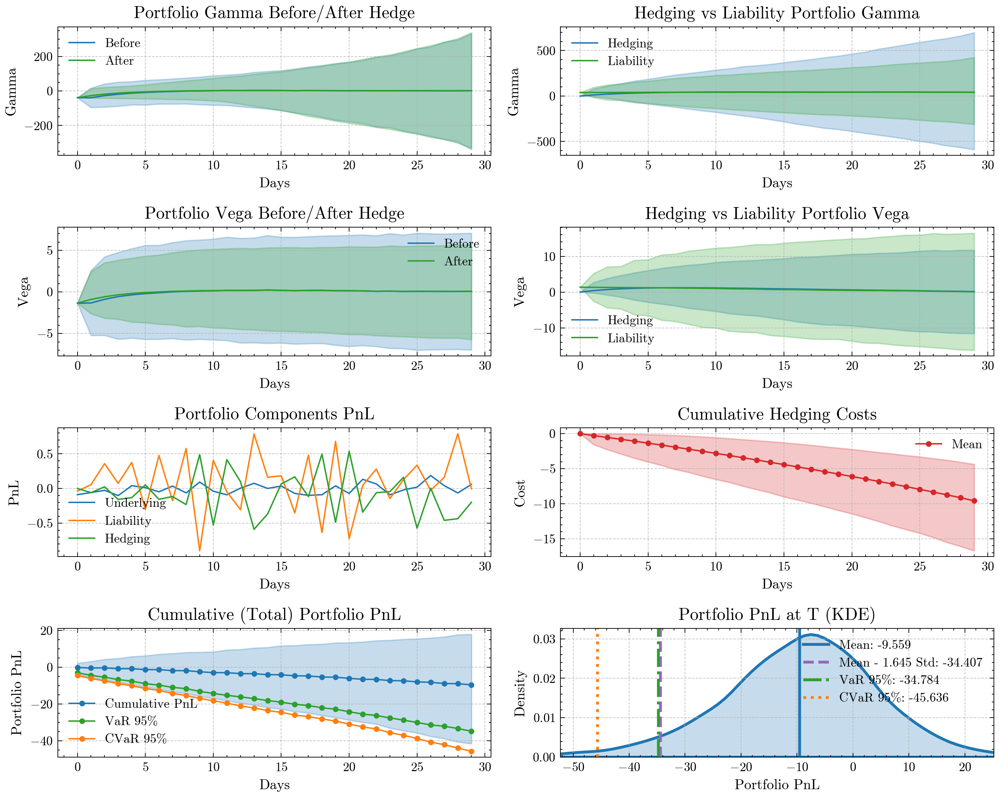

In [14]:
from pyparsing import line


plt.style.use(['science', 'no-latex'])

def present_results_paper(path: str, 
                          title_fontsize=12, 
                          label_fontsize=10, 
                          legend_fontsize=9, 
                          tick_fontsize=9) -> None:
    """
    Recreates the eight‑panel summary with styling that mirrors the
    reference figure.

        Row 1  ─ (γ) before/after hedge • hedging vs liability
        Row 2  ─ (ν) before/after hedge • hedging vs liability
        Row 3  ─ component PnL          • cumulative hedging costs
        Row 4  ─ cumulative total PnL   • PnL at T (density)
    """
    # Set global font sizes
    plt.rc('axes', titlesize=title_fontsize, labelsize=label_fontsize)
    plt.rc('legend', fontsize=legend_fontsize)
    plt.rc('xtick', labelsize=tick_fontsize)
    plt.rc('ytick', labelsize=tick_fontsize)
    
    # --------------------------------------------------------------------------
    df = pl.read_csv(path).to_pandas()
    # --------------------------------------------------------------------------
    fig, axs = plt.subplots(4, 2, figsize=(10, 8), dpi=300)

    # === 1,1 ─ Portfolio γ: before / after hedge --------------------------------
    mean_g_before = df.groupby("t")["gamma_before_hedge"].mean()
    q_g_before    = df.groupby("t")["gamma_before_hedge"].quantile([.025, .975]).unstack()
    mean_g_after  = df.groupby("t")["gamma_after_hedge"].mean()
    q_g_after     = df.groupby("t")["gamma_after_hedge"].quantile([.025, .975]).unstack()

    ax = axs[0, 0]
    ax.plot(mean_g_before, label="Before", c="tab:blue")
    ax.fill_between(mean_g_before.index, q_g_before[.025], q_g_before[.975],
                    alpha=.25, color="tab:blue")
    ax.plot(mean_g_after,  label="After",  c="tab:green")
    ax.fill_between(mean_g_after.index,  q_g_after[.025],  q_g_after[.975],
                    alpha=.25, color="tab:green")
    ax.set_title("Portfolio Gamma Before/After Hedge", fontsize=title_fontsize)
    ax.set_ylabel("Gamma", fontsize=label_fontsize)
    ax.set_xlabel("Days", fontsize=label_fontsize)
    ax.legend(fontsize=legend_fontsize)
    ax.tick_params(axis='both', labelsize=tick_fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # === 1,2 ─ Hedging vs liability portfolio γ ---------------------------------
    mean_h_gamma = df.groupby("t")["hed_port_gamma"].mean()
    q_h_gamma    = df.groupby("t")["hed_port_gamma"].quantile([.025, .975]).unstack()
    mean_l_gamma = -df.groupby("t")["liab_port_gamma"].mean()
    q_l_gamma    = -df.groupby("t")["liab_port_gamma"].quantile([.025, .975]).unstack()

    ax = axs[0, 1]
    ax.plot(mean_h_gamma, label="Hedging",   c="tab:blue")
    ax.fill_between(mean_h_gamma.index, q_h_gamma[.025], q_h_gamma[.975],
                    alpha=.25, color="tab:blue")
    ax.plot(mean_l_gamma, label="Liability", c="tab:green")
    ax.fill_between(mean_l_gamma.index, q_l_gamma[.025], q_l_gamma[.975],
                    alpha=.25, color="tab:green")
    ax.set_title("Hedging vs Liability Portfolio Gamma", fontsize=title_fontsize)
    ax.set_ylabel("Gamma", fontsize=label_fontsize)
    ax.set_xlabel("Days", fontsize=label_fontsize)
    ax.legend(fontsize=legend_fontsize)
    ax.tick_params(axis='both', labelsize=tick_fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # === 2,1 ─ Portfolio ν: before / after hedge --------------------------------
    mean_v_before = df.groupby("t")["vega_before_hedge"].mean()
    q_v_before    = df.groupby("t")["vega_before_hedge"].quantile([.025, .975]).unstack()
    mean_v_after  = df.groupby("t")["vega_after_hedge"].mean()
    q_v_after     = df.groupby("t")["vega_after_hedge"].quantile([.025, .975]).unstack()

    ax = axs[1, 0]
    ax.plot(mean_v_before, label="Before", c="tab:blue")
    ax.fill_between(mean_v_before.index, q_v_before[.025], q_v_before[.975],
                    alpha=.25, color="tab:blue")
    ax.plot(mean_v_after,  label="After",  c="tab:green")
    ax.fill_between(mean_v_after.index,  q_v_after[.025],  q_v_after[.975],
                    alpha=.25, color="tab:green")
    ax.set_title("Portfolio Vega Before/After Hedge", fontsize=title_fontsize)
    ax.set_ylabel("Vega", fontsize=label_fontsize)
    ax.set_xlabel("Days", fontsize=label_fontsize)
    ax.legend(fontsize=legend_fontsize)
    ax.tick_params(axis='both', labelsize=tick_fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # === 2,2 ─ Hedging vs liability portfolio ν ---------------------------------
    mean_h_vega = df.groupby("t")["hed_port_vega"].mean()
    q_h_vega    = df.groupby("t")["hed_port_vega"].quantile([.025, .975]).unstack()
    mean_l_vega = -df.groupby("t")["liab_port_vega"].mean()
    q_l_vega    = -df.groupby("t")["liab_port_vega"].quantile([.025, .975]).unstack()

    ax = axs[1, 1]
    ax.plot(mean_h_vega, label="Hedging",   c="tab:blue")
    ax.fill_between(mean_h_vega.index, q_h_vega[.025], q_h_vega[.975],
                    alpha=.25, color="tab:blue")
    ax.plot(mean_l_vega, label="Liability", c="tab:green")
    ax.fill_between(mean_l_vega.index, q_l_vega[.025], q_l_vega[.975],
                    alpha=.25, color="tab:green")
    ax.set_title("Hedging vs Liability Portfolio Vega", fontsize=title_fontsize)
    ax.set_ylabel("Vega", fontsize=label_fontsize)
    ax.set_xlabel("Days", fontsize=label_fontsize)
    ax.legend(fontsize=legend_fontsize)
    ax.tick_params(axis='both', labelsize=tick_fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # === 3,1 ─ Portfolio‑components PnL -----------------------------------------
    g = df.groupby("t")
    mean_stock = g["stock_pnl"].mean();      q_stock = g["stock_pnl"].quantile([.025, .975]).unstack()
    mean_liab  = g["liab_port_pnl"].mean();  q_liab  = g["liab_port_pnl"].quantile([.025, .975]).unstack()
    mean_hed   = g["hed_port_pnl"].mean();   q_hed   = g["hed_port_pnl"].quantile([.025, .975]).unstack()

    ax = axs[2, 0]
    ax.plot(mean_stock, label="Underlying", c="tab:blue")
    ax.plot(mean_liab,  label="Liability",  c="tab:orange")
    ax.plot(mean_hed,   label="Hedging",    c="tab:green")
    ax.set_title("Portfolio Components PnL", fontsize=title_fontsize)
    ax.set_ylabel("PnL", fontsize=label_fontsize)
    ax.set_xlabel("Days", fontsize=label_fontsize)
    ax.legend(fontsize=legend_fontsize)
    ax.tick_params(axis='both', labelsize=tick_fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # === 3,2 ─ Cumulative hedging costs -----------------------------------------
    hed_cost_cum = (
        df.groupby(["episode", "t"])["hed_cost"]
          .sum()
          .unstack()
          .cumsum(axis=1)
    )
    mean_hed_cost = hed_cost_cum.mean()
    q_hed_cost    = hed_cost_cum.quantile([.025, .975])

    ax = axs[2, 1]
    ax.plot(mean_hed_cost, c="tab:red", marker=".", label="Mean")
    ax.fill_between(mean_hed_cost.index, q_hed_cost.iloc[0], q_hed_cost.iloc[1],
                    alpha=.25, color="tab:red")
    ax.set_title("Cumulative Hedging Costs", fontsize=title_fontsize)
    ax.set_ylabel("Cost", fontsize=label_fontsize)
    ax.set_xlabel("Days", fontsize=label_fontsize)
    ax.legend(fontsize=legend_fontsize)
    ax.tick_params(axis='both', labelsize=tick_fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # === 4,1 ─ Cumulative (total) portfolio PnL ---------------------------------
    step_pnl = df.pivot_table(index="episode", columns="t", values="step_pnl")
    cum_pnl  = step_pnl.cumsum(axis=1)
    mean_cum = cum_pnl.mean()
    q_cum    = cum_pnl.quantile([.025, .975])

    VaR95  = cum_pnl.quantile(.05)
    CVaR95 = cum_pnl[cum_pnl.lt(VaR95)].mean()

    ax = axs[3, 0]
    ax.plot(mean_cum, c="tab:blue", marker=".", label="Cumulative PnL")
    ax.fill_between(mean_cum.index, q_cum.iloc[0], q_cum.iloc[1],
                    alpha=.25, color="tab:blue")
    ax.plot(VaR95,  c="tab:green", marker=".", label="VaR 95%")
    ax.plot(CVaR95, c="tab:orange", marker=".", label="CVaR 95%")
    ax.set_title("Cumulative (Total) Portfolio PnL", fontsize=title_fontsize)
    ax.set_ylabel("Portfolio PnL", fontsize=label_fontsize)
    ax.set_xlabel("Days", fontsize=label_fontsize)
    ax.legend(fontsize=legend_fontsize)
    ax.tick_params(axis='both', labelsize=tick_fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # === 4,2 ─ Portfolio PnL at T (KDE density) ---------------------------------
    pnl_T  = step_pnl.sum(axis=1)
    mean_T = pnl_T.mean()
    std_T  = pnl_T.std()
    VaR95_T  = pnl_T.quantile(.05)
    CVaR95_T = pnl_T[pnl_T < VaR95_T].mean()

    ax = axs[3, 1]
    sns.kdeplot(pnl_T, ax=ax, fill=True, color="tab:blue", alpha=0.25, linewidth=2)
    ax.axvline(mean_T,          c="tab:blue", linewidth=2,
               label=f"Mean: {mean_T:,.3f}")
    ax.axvline(mean_T - 1.645*std_T, c="tab:purple", linestyle="--", linewidth=2,
               label=f"Mean - 1.645 Std: {mean_T - 1.645*std_T:,.3f}")
    ax.axvline(VaR95_T,         c="tab:green", linestyle="-.", linewidth=2,
               label=f"VaR 95%: {VaR95_T:,.3f}")
    ax.axvline(CVaR95_T,        c="tab:orange", linestyle=":", linewidth=2,
               label=f"CVaR 95%: {CVaR95_T:,.3f}")
    ax.set_title("Portfolio PnL at T (KDE)", fontsize=title_fontsize)
    ax.set_ylabel("Density", fontsize=label_fontsize)
    ax.set_xlabel("Portfolio PnL", fontsize=label_fontsize)
    ax.set_xlim(pnl_T.quantile(.01), pnl_T.quantile(.99))
    ax.legend(fontsize=legend_fontsize, loc="upper right")
    ax.tick_params(axis='both', labelsize=tick_fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    # --------------------------------------------------------------------------
    print(
        f"E[PnL] at T: {mean_T:.4f} | "
        f"VaR 95%: {VaR95_T:.4f} | CVaR 95%: {CVaR95_T:.4f}"
    )
    plt.tight_layout()
    plt.savefig("Hedging_P_VaR_2.pdf", bbox_inches='tight', dpi=300)
    plt.show()


var_workfolder      = 'logs/(EXP 5) Heston P-Measure/spread_2/Heston_VaR_P_2_7/stochastic_process=Heston_spread=0.02_obj=var_threshold=0.95_critic=qr-huber_hedttm=30'
present_results_paper(f'{var_workfolder}/logs/eval_env/logs.csv')

------------------
## Experient Results

## GBM 0.5% Spread

In [ ]:
# 0.5% Transaction Cost
print(f'Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 0.5%. \nNote that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.\n')

mean_std_workfolder = 'logs/(EXP 1) GBM Experiments/spread_05/GBM_MeanStd_05/stochastic_process=GBM_spread=0.005_obj=meanstd_threshold=0.95_critic=qr-huber_hedttm=30'
var_workfolder      = 'logs/(EXP 1) GBM Experiments/spread_05/GBM_VaR_05/stochastic_process=GBM_spread=0.005_obj=var_threshold=0.95_critic=qr-huber_hedttm=30'
cvar_workfolder     = 'logs/(EXP 1) GBM Experiments/spread_05/GBM_CVaR_05/stochastic_process=GBM_spread=0.005_obj=cvar_threshold=0.95_critic=qr-huber_hedttm=30'
delta_workfolder    = 'logs/(EXP 1) GBM Experiments/spread_05/GBM_Delta_05/greekhedge_stochastic_process=GBM_spread=0.005_hedttm=30'
gamma_workfolder    = 'logs/(EXP 1) GBM Experiments/spread_05/GBM_Gamma_05/greekhedge_stochastic_process=GBM_spread=0.005_hedttm=30'

pnl_meanstd = generate_stat(f'{mean_std_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Mean-SD')
pnl_var     = generate_stat(f'{var_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'VaR95')
pnl_cvar    = generate_stat(f'{cvar_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'CVaR95')
pnl_delta   = generate_stat(f'{delta_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Delta')
pnl_gamma   = generate_stat(f'{gamma_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Gamma')

df = pd.DataFrame({
    # 'Mean-SD'               : pnl_meanstd,
    # 'CVaR95'                : pnl_cvar,
    'RL'                    : pnl_var,
    'Delta-Neutral'         : pnl_delta,
    'Delta-Gamma-Neutral'   : pnl_gamma,
})

fig = ff.create_distplot([df[c] for c in df.columns], df.columns, bin_size=1, show_hist=False)
fig.update_xaxes(range=[-100, 100])
fig.update_layout(legend=dict(yanchor="top", y=0.97, xanchor="left", x=0.01), hovermode="x unified")
fig.show()

# Visualize specific results
# present_results(f'{var_workfolder}/logs/eval_env/logs.csv')

## GBM 1% Spread

In [12]:
# 1% Transaction Cost
print(f'Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 1%. \nNote that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.\n')

mean_std_workfolder = 'logs/(EXP 1) GBM Experiments/spread_1/GBM_MeanStd_1/stochastic_process=GBM_spread=0.01_obj=meanstd_threshold=0.95_critic=qr-huber_hedttm=30'
var_workfolder      = 'logs/(EXP 1) GBM Experiments/spread_1/GBM_VaR_1/stochastic_process=GBM_spread=0.01_obj=var_threshold=0.95_critic=qr-huber_hedttm=30'
cvar_workfolder     = 'logs/(EXP 1) GBM Experiments/spread_1/GBM_CVaR_1/stochastic_process=GBM_spread=0.01_obj=cvar_threshold=0.95_critic=qr-huber_hedttm=30'
delta_workfolder    = 'logs/(EXP 1) GBM Experiments/spread_1/GBM_Delta_1/greekhedge_stochastic_process=GBM_spread=0.01_hedttm=30'
gamma_workfolder    = 'logs/(EXP 1) GBM Experiments/spread_1/GBM_Gamma_1/greekhedge_stochastic_process=GBM_spread=0.01_hedttm=30'

pnl_meanstd = generate_stat(f'{mean_std_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Mean-SD')
pnl_var     = generate_stat(f'{var_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'VaR95')
pnl_cvar    = generate_stat(f'{cvar_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'CVaR95')
pnl_delta   = generate_stat(f'{delta_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Delta')
pnl_gamma   = generate_stat(f'{gamma_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Gamma')

df = pd.DataFrame({
    # 'Mean-SD'               : pnl_meanstd,
    # 'CVaR95'                : pnl_cvar,
    'RL'                    : pnl_var,
    'Delta-Neutral'         : pnl_delta,
    'Delta-Gamma-Neutral'   : pnl_gamma,
})

fig = ff.create_distplot([df[c] for c in df.columns], df.columns, bin_size=1, show_hist=False)
fig.update_xaxes(range=[-100, 100])
fig.update_layout(legend=dict(yanchor="top", y=0.97, xanchor="left", x=0.01), hovermode="x unified")
fig.show()

# Visualize specific results
# present_results(f'{var_workfolder}/logs/eval_env/logs.csv')

Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 1%. 
Note that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.



Mean-SD              pnl mean: -4.94 (±0.07) | std: 2.25548    | Mean-SD: -8.65  | gamma-ratio:  0.62( 0.54/ 0.71) | vega-ratio:  0.13( 0.04/ 0.24)| var95:    -8.80 | cvar95:   -10.30 | E[TC]: -4.91 (±0.04)
VaR95                pnl mean: -4.42 (±0.07) | std: 2.45534    | Mean-SD: -8.46  | gamma-ratio:  0.53( 0.45/ 0.61) | vega-ratio:  0.12( 0.04/ 0.22)| var95:    -8.60 | cvar95:   -10.17 | E[TC]: -4.36 (±0.04)
CVaR95               pnl mean: -4.64 (±0.08) | std: 2.57060    | Mean-SD: -8.86  | gamma-ratio:  0.56( 0.46/ 0.67) | vega-ratio:  0.13( 0.04/ 0.23)| var95:    -8.87 | cvar95:   -10.22 | E[TC]: -4.60 (±0.04)
Delta                pnl mean: -0.25 (±0.50) | std: 16.02822   | Mean-SD: -26.62 | gamma-ratio:  0.00( 0.00/ 0.00) | vega-ratio:  0.00( 0.00/ 0.00)| var95:   -24.71 | cvar95:   -39.29 | E[TC]: 0.00  (±0.00)
Gamma                pnl mean: -6.85 (±0.05) | std: 1.74628    | Mean-SD: -9.73  | gamma-ratio:  1.00( 1.00/ 1.00) | vega-ratio:  0.17( 0.05/ 0.34)| var95:    -9.92 | cvar9

## GBM 2% Spread

Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 2%. 
Note that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.



Mean-SD              pnl mean: -1.97 (±0.48) | std: 15.65235   | Mean-SD: -27.71 | gamma-ratio:  0.07( 0.00/ 0.20) | vega-ratio:  0.03( 0.00/ 0.07)| var95:   -26.26 | cvar95:   -41.19 | E[TC]: -1.67 (±0.06)
VaR95                pnl mean: -6.09 (±0.14) | std: 4.61799    | Mean-SD: -13.69 | gamma-ratio:  0.29( 0.22/ 0.37) | vega-ratio:  0.08( 0.04/ 0.13)| var95:   -14.08 | cvar95:   -17.20 | E[TC]: -5.98 (±0.06)
CVaR95               pnl mean: -6.76 (±0.13) | std: 4.38480    | Mean-SD: -13.97 | gamma-ratio:  0.34( 0.24/ 0.44) | vega-ratio:  0.09( 0.04/ 0.15)| var95:   -14.16 | cvar95:   -16.83 | E[TC]: -6.66 (±0.07)
Delta                pnl mean: -0.25 (±0.49) | std: 16.02822   | Mean-SD: -26.62 | gamma-ratio:  0.00( 0.00/ 0.00) | vega-ratio:  0.00( 0.00/ 0.00)| var95:   -24.71 | cvar95:   -39.29 | E[TC]: 0.00  (±0.00)
Gamma                pnl mean: -13.68(±0.09) | std: 2.99600    | Mean-SD: -18.61 | gamma-ratio:  1.00( 1.00/ 1.00) | vega-ratio:  0.17( 0.05/ 0.34)| var95:   -18.93 | cvar9

SPREAD_EARNED : -0.2061
Mean PnL at T : -6.7582 - Mean_Std : -15.3524 - VaR: -14.1557 - CVaR: -16.8292


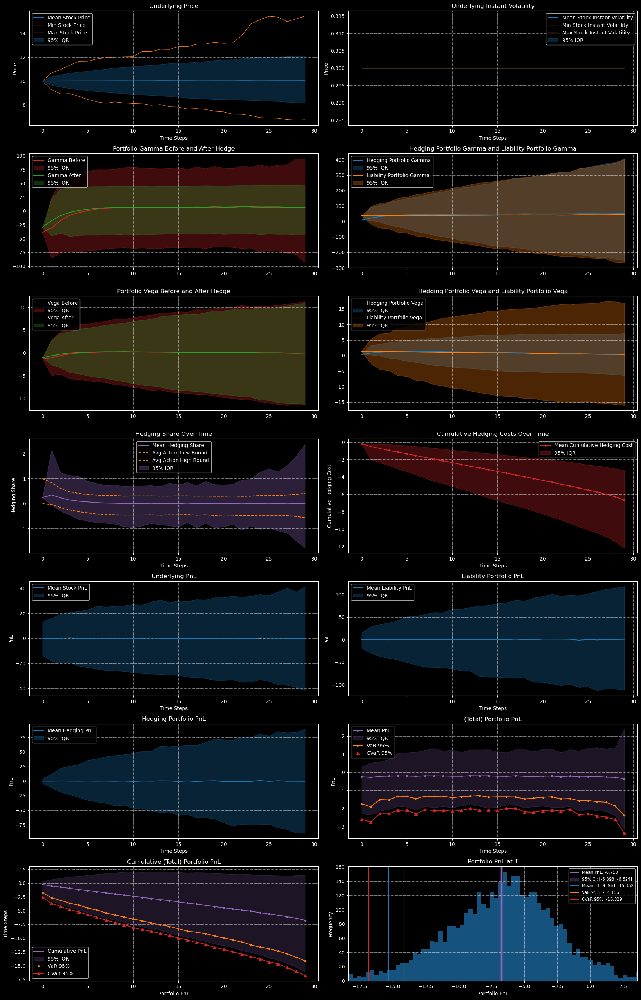

In [24]:
# 2% Transaction Cost
print(f'Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 2%. \nNote that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.\n')

mean_std_workfolder = 'logs/(EXP 1) GBM Experiments/spread_2/GBM_MeanStd_2/stochastic_process=GBM_spread=0.02_obj=meanstd_threshold=0.95_critic=qr-huber_hedttm=30'
var_workfolder      = 'logs/(EXP 1) GBM Experiments/spread_2/GBM_VaR_2/stochastic_process=GBM_spread=0.02_obj=var_threshold=0.95_critic=qr-huber_hedttm=30'
cvar_workfolder     = 'logs/(EXP 1) GBM Experiments/spread_2/GBM_CVaR_2/stochastic_process=GBM_spread=0.02_obj=cvar_threshold=0.95_critic=qr-huber_hedttm=30'
delta_workfolder    = 'logs/(EXP 1) GBM Experiments/spread_2/GBM_Delta_2/greekhedge_stochastic_process=GBM_spread=0.02_hedttm=30'
gamma_workfolder    = 'logs/(EXP 1) GBM Experiments/spread_2/GBM_Gamma_2/greekhedge_stochastic_process=GBM_spread=0.02_hedttm=30'

pnl_meanstd = generate_stat(f'{mean_std_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Mean-SD')
pnl_var     = generate_stat(f'{var_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'VaR95')
pnl_cvar    = generate_stat(f'{cvar_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'CVaR95')
pnl_delta   = generate_stat(f'{delta_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Delta')
pnl_gamma   = generate_stat(f'{gamma_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Gamma')

df = pd.DataFrame({
    # 'Mean-SD'               : pnl_meanstd,
    # 'CVaR95'                : pnl_cvar,
    'RL'                    : pnl_var,
    'Delta-Neutral'         : pnl_delta,
    'Delta-Gamma-Neutral'   : pnl_gamma,
})

fig = ff.create_distplot([df[c] for c in df.columns], df.columns, bin_size=1, show_hist=False)
fig.update_xaxes(range=[-100, 100])
fig.update_layout(legend=dict(yanchor="top", y=0.97, xanchor="left", x=0.01), hovermode="x unified")
fig.show()

# Visualize specific results
present_results(f'{cvar_workfolder}/logs/eval_env/logs.csv')

## Heston 0.5% Spread

In [ ]:
# 0.5% Transaction Cost
print(f'Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 0.5%. \nNote that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.\n')

mean_std_workfolder = 'logs/(EXP 2.1) Heston Experiments/spread_05/Heston_Mean_Std_Batch/Heston_Mean_Std_05_3/stochastic_process=Heston_spread=0.005_obj=meanstd_threshold=0.95_critic=qr-huber_hedttm=30'
var_workfolder      = 'logs/(EXP 2.1) Heston Experiments/spread_05/Heston_VaR_Batch/Heston_VaR_05_16/stochastic_process=Heston_spread=0.005_obj=var_threshold=0.95_critic=qr-huber_hedttm=30'
cvar_workfolder     = 'logs/(EXP 2.1) Heston Experiments/spread_05/Heston_CVaR_Batch/Heston_CVaR_05_2/stochastic_process=Heston_spread=0.005_obj=cvar_threshold=0.95_critic=qr-huber_hedttm=30'
delta_workfolder    = 'logs/(EXP 2.1) Heston Experiments/spread_05/Heston_Delta_05/greekhedge_stochastic_process=Heston_spread=0.005_hedttm=30'
gamma_workfolder    = 'logs/(EXP 2.1) Heston Experiments/spread_05/Heston_Gamma_05/greekhedge_stochastic_process=Heston_spread=0.005_hedttm=30'
vega_workfolder     = 'logs/(EXP 2.1) Heston Experiments/spread_05/Heston_Vega_05/greekhedge_stochastic_process=Heston_spread=0.005_hedttm=30'

pnl_meanstd = generate_stat(f'{mean_std_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Mean-SD')
pnl_var     = generate_stat(f'{var_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'VaR95')
pnl_cvar    = generate_stat(f'{cvar_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'CVaR95')
pnl_delta   = generate_stat(f'{delta_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Delta')
pnl_gamma   = generate_stat(f'{gamma_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Gamma')
pnl_vega    = generate_stat(f'{vega_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Vega')

df = pd.DataFrame({
    # 'Mean-SD'               : pnl_meanstd,
    # 'CVaR95'                : pnl_cvar,
    'RL'                    : pnl_var,
    'Delta-Neutral'         : pnl_delta,
    'Delta-Gamma-Neutral'   : pnl_gamma,
})

fig = ff.create_distplot([df[c] for c in df.columns], df.columns, bin_size=1, show_hist=False)
fig.update_xaxes(range=[-200, 200])
fig.update_layout(legend=dict(yanchor="top", y=0.97, xanchor="left", x=0.01), hovermode="x unified")
fig.show()

# Visualize specific results
# present_results(f'{var_workfolder}/logs/eval_env/logs.csv')

## Heston 1% Spread

In [5]:
# 0.5% Transaction Cost
print(f'Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 1%. \nNote that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.\n')

mean_std_workfolder = 'logs/(EXP 2.1) Heston Experiments/spread_1/Heston_Mean_Std_Batch/Heston_Mean_Std_1_10/stochastic_process=Heston_spread=0.01_obj=meanstd_threshold=0.95_critic=qr-huber_hedttm=30'
var_workfolder      = 'logs/(EXP 2.1) Heston Experiments/spread_1/Heston_VaR_Batch/Heston_VaR_1_31/stochastic_process=Heston_spread=0.01_obj=var_threshold=0.95_critic=qr-huber_hedttm=30'
cvar_workfolder     = 'logs/(EXP 2.1) Heston Experiments/spread_1/Heston_CVaR_Batch/Heston_CVaR_1_17/stochastic_process=Heston_spread=0.01_obj=cvar_threshold=0.95_critic=qr-huber_hedttm=30'
delta_workfolder    = 'logs/(EXP 2.1) Heston Experiments/spread_1/Heston_Delta_1/greekhedge_stochastic_process=Heston_spread=0.01_hedttm=30'
gamma_workfolder    = 'logs/(EXP 2.1) Heston Experiments/spread_1/Heston_Gamma_1/greekhedge_stochastic_process=Heston_spread=0.01_hedttm=30'
vega_workfolder     = 'logs/(EXP 2.1) Heston Experiments/spread_1/Heston_Vega_1/greekhedge_stochastic_process=Heston_spread=0.01_hedttm=30'

pnl_meanstd = generate_stat(f'{mean_std_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Mean-SD')
pnl_var     = generate_stat(f'{var_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'VaR95')
pnl_cvar    = generate_stat(f'{cvar_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'CVaR95')
pnl_delta   = generate_stat(f'{delta_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Delta')
pnl_gamma   = generate_stat(f'{gamma_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Gamma')
pnl_vega    = generate_stat(f'{vega_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Vega')

df = pd.DataFrame({
    # 'Mean-SD'               : pnl_meanstd,
    # 'CVaR95'                : pnl_cvar,
    'RL'                    : pnl_var,
    'Delta-Neutral'         : pnl_delta,
    'Delta-Gamma-Neutral'   : pnl_gamma,
})

fig = ff.create_distplot([df[c] for c in df.columns], df.columns, bin_size=1, show_hist=False)
fig.update_xaxes(range=[-200, 200])
fig.update_layout(legend=dict(yanchor="top", y=0.97, xanchor="left", x=0.01), hovermode="x unified")
fig.show()

# Visualize specific results
# present_results(f'{var_workfolder}/logs/eval_env/logs.csv')

Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 1%. 
Note that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.

Mean-SD              pnl mean: -6.46 (±0.34) | std: 15.33109   | Mean-SD: -31.68 | gamma-ratio:  0.31( 0.03/ 0.59) | vega-ratio:  0.29( 0.12/ 0.44)| var95:   -30.70 | cvar95:   -42.18 | E[TC]: -7.04 (±0.05)
VaR95                pnl mean: -5.58 (±0.33) | std: 15.73649   | Mean-SD: -31.47 | gamma-ratio:  0.24( 0.02/ 0.45) | vega-ratio:  0.22( 0.11/ 0.32)| var95:   -30.99 | cvar95:   -42.26 | E[TC]: -5.94 (±0.04)
CVaR95               pnl mean: -4.75 (±0.35) | std: 16.40519   | Mean-SD: -31.73 | gamma-ratio:  0.43( 0.06/ 0.69) | vega-ratio:  0.22( 0.09/ 0.34)| var95:   -31.06 | cvar95:   -44.22 | E[TC]: -7.06 (±0.06)
Delta                pnl mean: -5.62 (±0.80) | std: 36.62567   | Mean-SD: -65.87 | gamma-ratio:  0.00(-0.00/ 0.00) | vega-ratio: 

## Heston 2% Spread

Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 2%. 
Note that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.



VaR95                pnl mean: -9.38 (±0.33) | std: 15.19475   | Mean-SD: -34.37 | gamma-ratio:  0.33( 0.08/ 0.52) | vega-ratio:  0.18( 0.09/ 0.27)| var95:   -34.72 | cvar95:   -45.14 | E[TC]: -9.39 (±0.06)
Delta                pnl mean: 0.37  (±0.74) | std: 34.15477   | Mean-SD: -55.81 | gamma-ratio:  0.00(-0.00/ 0.00) | vega-ratio: -0.00(-0.00/ 0.00)| var95:   -54.54 | cvar95:   -77.17 | E[TC]: -0.00 (±0.00)
Gamma                pnl mean: -12.50(±0.39) | std: 17.77547   | Mean-SD: -41.74 | gamma-ratio:  1.00( 1.00/ 1.00) | vega-ratio:  0.18( 0.05/ 0.35)| var95:   -41.96 | cvar95:   -54.83 | E[TC]: -12.52(±0.06)
Vega                 pnl mean: -23.09(±0.47) | std: 21.89792   | Mean-SD: -59.11 | gamma-ratio:  0.19(-0.06/ 0.57) | vega-ratio:  1.00( 1.00/ 1.00)| var95:   -57.43 | cvar95:   -77.47 | E[TC]: -23.23(±0.10)

E[PnL] at T: -9.3751 | VaR 95%: -34.7207 | CVaR 95%: -45.1376


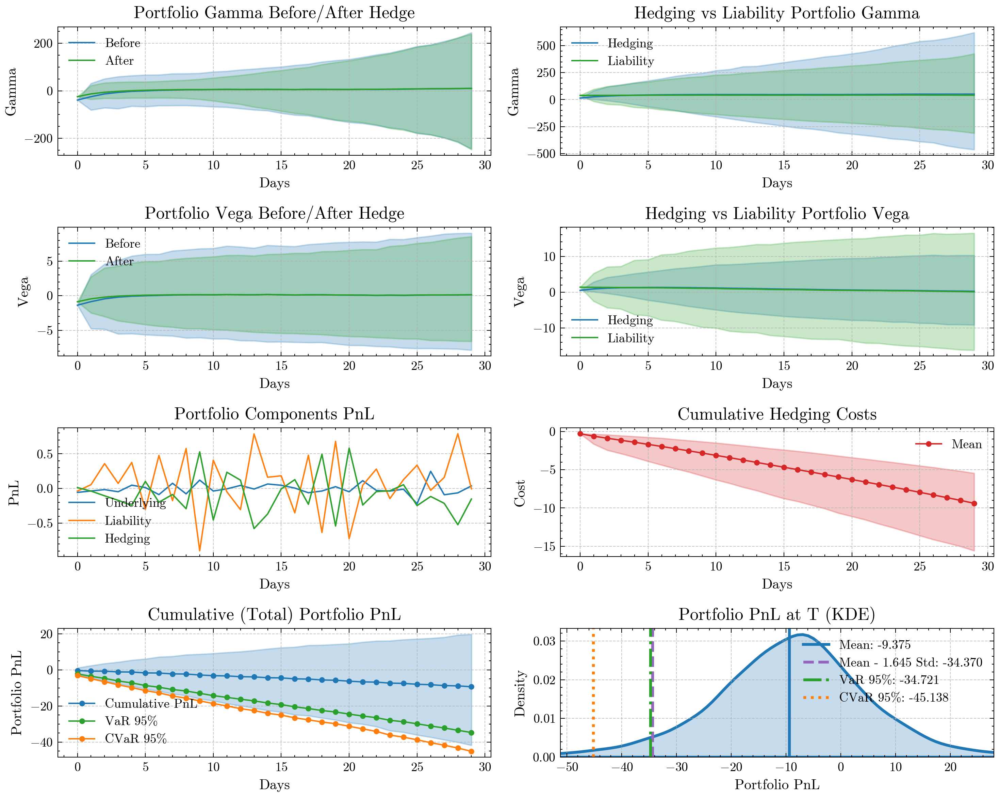

In [13]:
# 0.5% Transaction Cost
print(f'Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 2%. \nNote that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.\n')


var_workfolder      = 'logs/(EXP 5) Heston P-Measure/spread_2/Heston_VaR_P_2_9/stochastic_process=Heston_spread=0.02_obj=var_threshold=0.95_critic=qr-huber_hedttm=30'
delta_workfolder    = 'logs/(EXP 5) Heston P-Measure/spread_2/Heston_Delta_P/greekhedge_stochastic_process=Heston_spread=0.02_hedttm=30'
gamma_workfolder    = 'logs/(EXP 5) Heston P-Measure/spread_2/Heston_Gamma_P/greekhedge_stochastic_process=Heston_spread=0.02_hedttm=30'
vega_workfolder     = 'logs/(EXP 5) Heston P-Measure/spread_2/Heston_Vega_P/greekhedge_stochastic_process=Heston_spread=0.02_hedttm=30'

# pnl_meanstd = generate_stat(f'{mean_std_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Mean-SD')
pnl_var     = generate_stat(f'{var_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'VaR95')
# pnl_cvar    = generate_stat(f'{cvar_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'CVaR95')
pnl_delta   = generate_stat(f'{delta_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Delta')
pnl_gamma   = generate_stat(f'{gamma_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Gamma')
pnl_vega    = generate_stat(f'{vega_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Vega')

df = pd.DataFrame({
    # 'Mean-SD'               : pnl_meanstd,
    # 'CVaR95'                : pnl_cvar,
    'RL'                    : pnl_var,
    'Delta-Neutral'         : pnl_delta,
    'Delta-Gamma-Neutral'   : pnl_gamma,
})

fig = ff.create_distplot([df[c] for c in df.columns], df.columns, bin_size=1, show_hist=False)
fig.update_xaxes(range=[-200, 200])
fig.update_layout(legend=dict(yanchor="top", y=0.97, xanchor="left", x=0.01), hovermode="x unified")
plt.show() ; print()

# Visualize specific results
present_results_paper(f'{var_workfolder}/logs/eval_env/logs.csv')

Mean PnL at T : -6.1176 - Mean_Std : -41.2663 - VaR: -34.3664 - CVaR: -47.8483


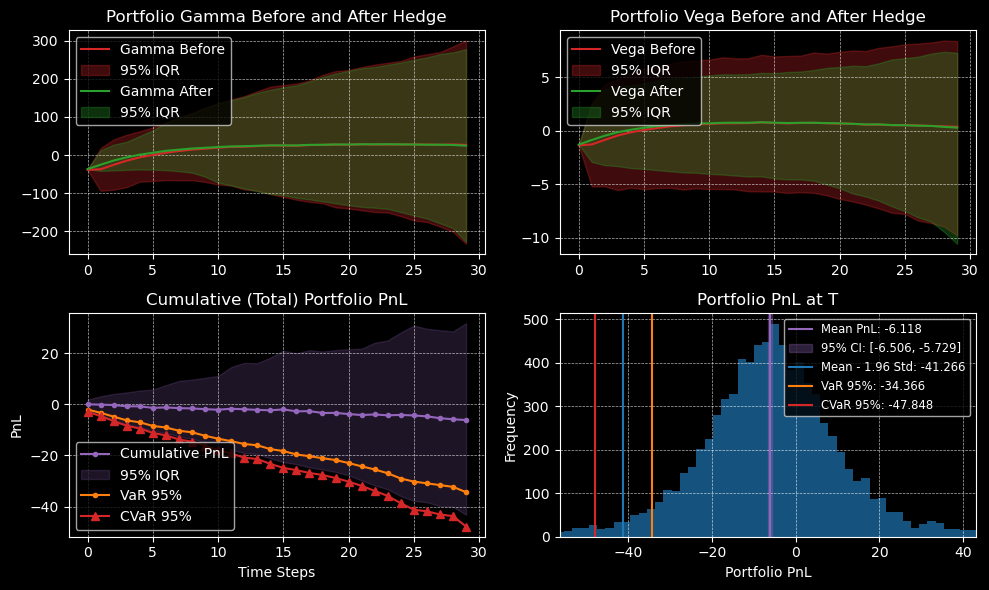

In [7]:
def plot_key_results(path, SPREAD=0.005):
    df = pl.read_csv(path).to_pandas()
    
    # Create a 2x2 subplot
    fig, axs = plt.subplots(2, 2, figsize=(10, 6))
    
    # Row 1, Col 1: Portfolio Gamma before and after hedge
    mean_gamma_before = df.groupby('t')['gamma_before_hedge'].mean()    
    quantiles_before = df.groupby('t')['gamma_before_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    mean_gamma_after = df.groupby('t')['gamma_after_hedge'].mean()
    quantiles_after = df.groupby('t')['gamma_after_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    axs[0, 0].plot(mean_gamma_before, label='Gamma Before', color='tab:red')
    axs[0, 0].fill_between(mean_gamma_before.index, quantiles_before[0.025], quantiles_before[0.975], 
                           alpha=0.3, label='95% IQR', color='tab:red')
    axs[0, 0].plot(mean_gamma_after, label='Gamma After', color='tab:green')
    axs[0, 0].fill_between(mean_gamma_after.index, quantiles_after[0.025], quantiles_after[0.975], 
                           alpha=0.3, label='95% IQR', color='tab:green')
    axs[0, 0].set_title('Portfolio Gamma Before and After Hedge')
    axs[0, 0].legend(loc='upper left')
    axs[0, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    
    # Row 1, Col 2: Portfolio Vega before and after hedge
    mean_vega_before = df.groupby('t')['vega_before_hedge'].mean()
    quantiles_before = df.groupby('t')['vega_before_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    mean_vega_after = df.groupby('t')['vega_after_hedge'].mean()
    quantiles_after = df.groupby('t')['vega_after_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    axs[0, 1].plot(mean_vega_before, label='Vega Before', color='tab:red')
    axs[0, 1].fill_between(mean_vega_before.index, quantiles_before[0.025], quantiles_before[0.975], 
                           alpha=0.3, label='95% IQR', color='tab:red')
    axs[0, 1].plot(mean_vega_after, label='Vega After', color='tab:green')
    axs[0, 1].fill_between(mean_vega_after.index, quantiles_after[0.025], quantiles_after[0.975], 
                           alpha=0.3, label='95% IQR', color='tab:green')
    axs[0, 1].set_title('Portfolio Vega Before and After Hedge')
    axs[0, 1].legend(loc='upper left')
    axs[0, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    
    # Row 2, Col 1: Cumulative (Total) Portfolio PnL
    df_pnl = df[['t', 'episode', 'step_pnl']].pivot(columns='t', index='episode', values='step_pnl')
    df_pnl_cum = df_pnl.cumsum(axis=1)
    mean_pnl_cum = df_pnl_cum.mean(axis=0)
    quantiles_cum = df_pnl_cum.quantile([0.025, 0.975])
    
    axs[1, 0].plot(mean_pnl_cum, label='Cumulative PnL', color='tab:purple', marker='.')
    axs[1, 0].fill_between(mean_pnl_cum.index, quantiles_cum.iloc[0,:], quantiles_cum.iloc[1,:], 
                           alpha=0.2, label='95% IQR', color='tab:purple')
    # Plot the VaR_95 and CVaR_95
    VaR_95 = df_pnl_cum.quantile(0.05)
    CVaR_95 = df_pnl_cum[df_pnl_cum < VaR_95].mean()
    axs[1, 0].plot(VaR_95, label='VaR 95%', color='tab:orange', marker='.')
    axs[1, 0].plot(CVaR_95, label='CVaR 95%', color='tab:red', marker='^')
    
    axs[1, 0].set_title('Cumulative (Total) Portfolio PnL')
    axs[1, 0].set_xlabel('Time Steps') 
    axs[1, 0].set_ylabel('PnL')
    axs[1, 0].legend()
    axs[1, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    
    # Row 2, Col 2: Portfolio PnL at T (Histogram)
    df_pnl_T = df.groupby('episode')['step_pnl'].sum()
    axs[1, 1].hist(df_pnl_T, bins=128, color='tab:blue', alpha=0.7)
    
    # Calculate statistics
    Mean = df_pnl_T.mean()
    Std = df_pnl_T.std()
    Mean_Std = Mean - 1.96 * Std
    n = len(df_pnl_T)
    ci_lower, ci_upper = Mean - 1.96 * (Std / np.sqrt(n)), Mean + 1.96 * (Std / np.sqrt(n))
    VaR_95 = df_pnl_T.quantile(0.05)
    CVaR_95 = df_pnl_T[df_pnl_T < VaR_95].mean()
    
    # Plot vertical lines
    axs[1, 1].set_ylim(0, axs[1, 1].get_ylim()[1])
    axs[1, 1].axvline(Mean, color='tab:purple', label=f'Mean PnL: {Mean:.3f}')
    axs[1, 1].fill_betweenx(y=[0, axs[1, 1].get_ylim()[1]], x1=ci_lower, x2=ci_upper, 
                            color='tab:purple', alpha=0.3, label=f'95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]')
    axs[1, 1].axvline(Mean_Std, color='tab:blue', label=f'Mean - 1.96 Std: {Mean_Std:.3f}')
    axs[1, 1].axvline(VaR_95, color='tab:orange', label=f'VaR 95%: {VaR_95:.3f}')
    axs[1, 1].axvline(CVaR_95, color='tab:red', label=f'CVaR 95%: {CVaR_95:.3f}')
    
    # Finalize plot
    axs[1, 1].legend(loc='upper right', fontsize='small')
    axs[1, 1].set_title('Portfolio PnL at T')
    axs[1, 1].set_xlabel('Portfolio PnL')
    axs[1, 1].set_ylabel('Frequency')
    axs[1, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    axs[1, 1].set_xlim(df_pnl_T.quantile(0.01), df_pnl_T.quantile(0.99))
    
    # Print key statistics
    print(f"Mean PnL at T : {Mean:.4f} - Mean_Std : {Mean_Std:.4f} - VaR: {VaR_95:.4f} - CVaR: {CVaR_95:.4f}")
    
    plt.tight_layout()
    plt.show()

# Call the function using the same path as in your current active cell
plot_key_results(f'{cvar_workfolder}/logs/eval_env/logs.csv')

------------------------------------------
# Experiment 2.2 - European Put Hedging

## Heston 1% Spread

Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 2%. 
Note that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.

Mean-SD              pnl mean: -0.39 (±0.01) | std: 0.41330    | Mean-SD: -1.07  | gamma-ratio:  0.69( 0.50/ 0.87) | vega-ratio:  0.78( 0.71/ 0.86)| var95:    -0.98 | cvar95:    -1.18 | E[TC]: -0.43 (±0.00)
Delta                pnl mean: -5.39 (±0.17) | std: 7.90215    | Mean-SD: -18.39 | gamma-ratio: -0.00( 0.00/ 0.00) | vega-ratio:  0.00( 0.00/ 0.00)| var95:   -19.48 | cvar95:   -24.51 | E[TC]: -0.00 (±0.00)
Gamma                pnl mean: -0.71 (±0.01) | std: 0.59072    | Mean-SD: -1.68  | gamma-ratio:  1.00( 1.00/ 1.00) | vega-ratio:  0.82( 0.51/ 1.01)| var95:    -1.67 | cvar95:    -2.06 | E[TC]: -0.77 (±0.01)
Vega                 pnl mean: -0.53 (±0.01) | std: 0.61319    | Mean-SD: -1.54  | gamma-ratio:  0.68( 0.45/ 0.88) | vega-ratio: 

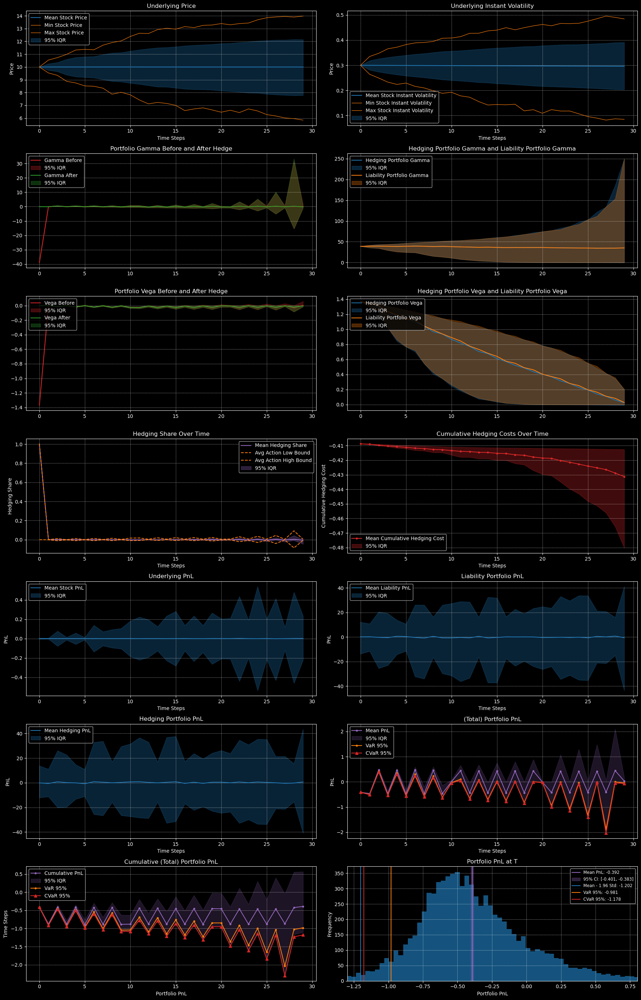

In [11]:
# 0.5% Transaction Cost
print(f'Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 2%. \nNote that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.\n')

mean_std_workfolder = 'logs/(EXP 2.2) Heston Experiments/spread_1/Heston_Mean_Std_Batch/Heston_Mean_Std_1_1/stochastic_process=Heston_spread=0.01_obj=meanstd_threshold=0.95_critic=qr-huber_hedttm=30'
var_workfolder      = ''
cvar_workfolder     = ''
delta_workfolder    = 'logs/(EXP 2.2) Heston Experiments/spread_1/Heston_Delta_1/greekhedge_stochastic_process=Heston_spread=0.01_hedttm=30'
gamma_workfolder    = 'logs/(EXP 2.2) Heston Experiments/spread_1/Heston_Gamma_1/greekhedge_stochastic_process=Heston_spread=0.01_hedttm=30'
vega_workfolder     = 'logs/(EXP 2.2) Heston Experiments/spread_1/Heston_Vega_1/greekhedge_stochastic_process=Heston_spread=0.01_hedttm=30'

pnl_meanstd = generate_stat(f'{mean_std_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Mean-SD')
# pnl_var     = generate_stat(f'{var_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'VaR95')
# pnl_cvar    = generate_stat(f'{cvar_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'CVaR95')
pnl_delta   = generate_stat(f'{delta_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Delta')
pnl_gamma   = generate_stat(f'{gamma_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Gamma')
pnl_vega    = generate_stat(f'{vega_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Vega')

df = pd.DataFrame({
    # 'Mean-SD'               : pnl_meanstd,
    # 'CVaR95'                : pnl_cvar,
    'RL'                    : pnl_meanstd,
    'Delta-Neutral'         : pnl_delta,
    'Delta-Gamma-Neutral'   : pnl_gamma,
})

fig = ff.create_distplot([df[c] for c in df.columns], df.columns, bin_size=1, show_hist=False)
fig.update_xaxes(range=[-200, 200])
fig.update_layout(legend=dict(yanchor="top", y=0.97, xanchor="left", x=0.01), hovermode="x unified")
plt.show()

# Visualize specific results
present_results(f'{mean_std_workfolder}/logs/eval_env/logs.csv', SPREAD=0.01)

## Heston 2% Spread

Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 2%. 
Note that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.

Mean-SD              pnl mean: -0.81 (±0.01) | std: 0.47048    | Mean-SD: -1.59  | gamma-ratio:  0.71( 0.50/ 0.88) | vega-ratio:  0.81( 0.74/ 0.88)| var95:    -1.42 | cvar95:    -1.80 | E[TC]: -0.88 (±0.00)
Delta                pnl mean: -5.39 (±0.17) | std: 7.90215    | Mean-SD: -18.39 | gamma-ratio: -0.00( 0.00/ 0.00) | vega-ratio:  0.00( 0.00/ 0.00)| var95:   -19.48 | cvar95:   -24.51 | E[TC]: -0.00 (±0.00)
Gamma                pnl mean: -1.48 (±0.01) | std: 0.63487    | Mean-SD: -2.52  | gamma-ratio:  1.00( 1.00/ 1.00) | vega-ratio:  0.82( 0.51/ 1.01)| var95:    -2.66 | cvar95:    -3.10 | E[TC]: -1.54 (±0.01)
Vega                 pnl mean: -1.15 (±0.02) | std: 0.71869    | Mean-SD: -2.33  | gamma-ratio:  0.68( 0.45/ 0.88) | vega-ratio: 

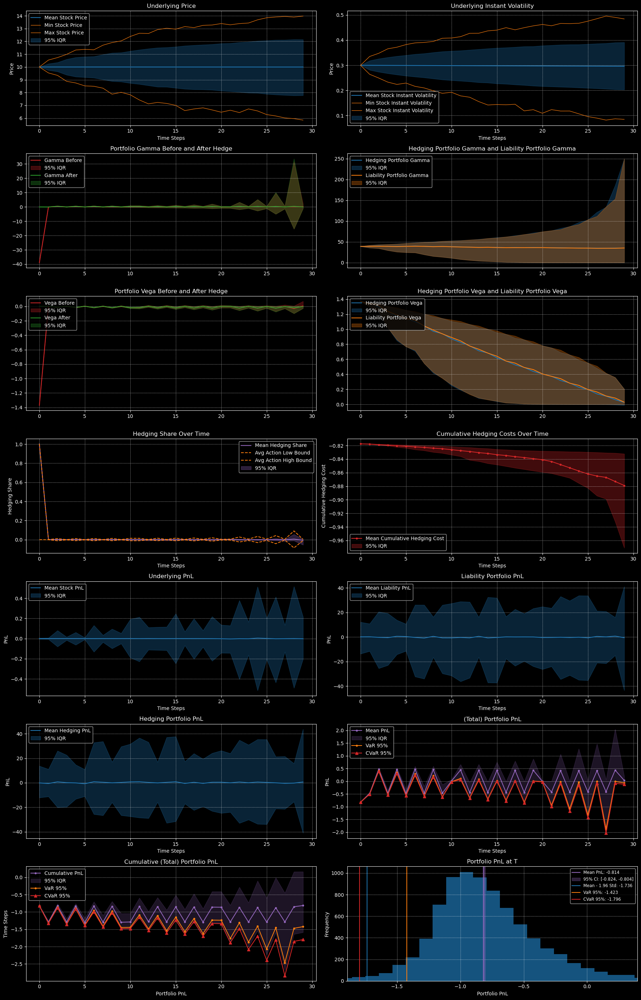

In [6]:
# 0.5% Transaction Cost
print(f'Comparison of gain distribution for delta hedging, delta-gamma-neutral hedging, and hedging by the VaR95 RL agent when transaction cost = 2%. \nNote that the 5th percentile of the gain distribution corresponds to the 95th percentile loss in Table 1.\n')

mean_std_workfolder = 'logs/(EXP 2.2) Heston Experiments/spread_2/Heston_Mean_Std_Batch/Heston_Mean_Std_2_8/stochastic_process=Heston_spread=0.02_obj=meanstd_threshold=0.95_critic=qr-huber_hedttm=30'
var_workfolder      = ''
cvar_workfolder     = ''
delta_workfolder    = 'logs/(EXP 2.2) Heston Experiments/spread_2/Heston_Delta_2/greekhedge_stochastic_process=Heston_spread=0.02_hedttm=30'
gamma_workfolder    = 'logs/(EXP 2.2) Heston Experiments/spread_2/Heston_Gamma_2/greekhedge_stochastic_process=Heston_spread=0.02_hedttm=30'
vega_workfolder     = 'logs/(EXP 2.2) Heston Experiments/spread_2/Heston_Vega_2/greekhedge_stochastic_process=Heston_spread=0.02_hedttm=30'

pnl_meanstd = generate_stat(f'{mean_std_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Mean-SD')
# pnl_var     = generate_stat(f'{var_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'VaR95')
# pnl_cvar    = generate_stat(f'{cvar_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'CVaR95')
pnl_delta   = generate_stat(f'{delta_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Delta')
pnl_gamma   = generate_stat(f'{gamma_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Gamma')
pnl_vega    = generate_stat(f'{vega_workfolder}/logs/eval_env/logs.csv', eval_quantiles, 'Vega')

df = pd.DataFrame({
    # 'Mean-SD'               : pnl_meanstd,
    # 'CVaR95'                : pnl_cvar,
    'RL'                    : pnl_meanstd,
    'Delta-Neutral'         : pnl_delta,
    'Delta-Gamma-Neutral'   : pnl_gamma,
})

fig = ff.create_distplot([df[c] for c in df.columns], df.columns, bin_size=1, show_hist=False)
fig.update_xaxes(range=[-200, 200])
fig.update_layout(legend=dict(yanchor="top", y=0.97, xanchor="left", x=0.01), hovermode="x unified")
plt.show()

# Visualize specific results
present_results(f'{mean_std_workfolder}/logs/eval_env/logs.csv', SPREAD=0.02)

In [ ]:
def plot_key_results(path, SPREAD=0.005):
    df = pl.read_csv(path).to_pandas()
    
    # Create a 2x2 subplot
    fig, axs = plt.subplots(2, 2, figsize=(10, 6))
    
    # Row 1, Col 1: Portfolio Gamma before and after hedge
    mean_gamma_before = df.groupby('t')['gamma_before_hedge'].mean()    
    quantiles_before = df.groupby('t')['gamma_before_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    mean_gamma_after = df.groupby('t')['gamma_after_hedge'].mean()
    quantiles_after = df.groupby('t')['gamma_after_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    axs[0, 0].plot(mean_gamma_before, label='Gamma Before', color='tab:red')
    axs[0, 0].fill_between(mean_gamma_before.index, quantiles_before[0.025], quantiles_before[0.975], 
                           alpha=0.3, label='95% IQR', color='tab:red')
    axs[0, 0].plot(mean_gamma_after, label='Gamma After', color='tab:green')
    axs[0, 0].fill_between(mean_gamma_after.index, quantiles_after[0.025], quantiles_after[0.975], 
                           alpha=0.3, label='95% IQR', color='tab:green')
    axs[0, 0].set_title('Portfolio Gamma Before and After Hedge')
    axs[0, 0].legend(loc='upper left')
    axs[0, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    
    # Row 1, Col 2: Portfolio Vega before and after hedge
    mean_vega_before = df.groupby('t')['vega_before_hedge'].mean()
    quantiles_before = df.groupby('t')['vega_before_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    mean_vega_after = df.groupby('t')['vega_after_hedge'].mean()
    quantiles_after = df.groupby('t')['vega_after_hedge'].quantile([0.025, 0.975]).unstack(level=1)
    axs[0, 1].plot(mean_vega_before, label='Vega Before', color='tab:red')
    axs[0, 1].fill_between(mean_vega_before.index, quantiles_before[0.025], quantiles_before[0.975], 
                           alpha=0.3, label='95% IQR', color='tab:red')
    axs[0, 1].plot(mean_vega_after, label='Vega After', color='tab:green')
    axs[0, 1].fill_between(mean_vega_after.index, quantiles_after[0.025], quantiles_after[0.975], 
                           alpha=0.3, label='95% IQR', color='tab:green')
    axs[0, 1].set_title('Portfolio Vega Before and After Hedge')
    axs[0, 1].legend(loc='upper left')
    axs[0, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    
    # Row 2, Col 1: Cumulative (Total) Portfolio PnL
    df_pnl = df[['t', 'episode', 'step_pnl']].pivot(columns='t', index='episode', values='step_pnl')
    df_pnl_cum = df_pnl.cumsum(axis=1)
    mean_pnl_cum = df_pnl_cum.mean(axis=0)
    quantiles_cum = df_pnl_cum.quantile([0.025, 0.975])
    
    axs[1, 0].plot(mean_pnl_cum, label='Cumulative PnL', color='tab:purple', marker='.')
    axs[1, 0].fill_between(mean_pnl_cum.index, quantiles_cum.iloc[0,:], quantiles_cum.iloc[1,:], 
                           alpha=0.2, label='95% IQR', color='tab:purple')
    # Plot the VaR_95 and CVaR_95
    VaR_95 = df_pnl_cum.quantile(0.05)
    CVaR_95 = df_pnl_cum[df_pnl_cum < VaR_95].mean()
    axs[1, 0].plot(VaR_95, label='VaR 95%', color='tab:orange', marker='.')
    axs[1, 0].plot(CVaR_95, label='CVaR 95%', color='tab:red', marker='^')
    
    axs[1, 0].set_title('Cumulative (Total) Portfolio PnL')
    axs[1, 0].set_xlabel('Time Steps') 
    axs[1, 0].set_ylabel('PnL')
    axs[1, 0].legend()
    axs[1, 0].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    
    # Row 2, Col 2: Portfolio PnL at T (Histogram)
    df_pnl_T = df.groupby('episode')['step_pnl'].sum()
    axs[1, 1].hist(df_pnl_T, bins=128, color='tab:blue', alpha=0.7)
    
    # Calculate statistics
    Mean = df_pnl_T.mean()
    Std = df_pnl_T.std()
    Mean_Std = Mean - 1.96 * Std
    n = len(df_pnl_T)
    ci_lower, ci_upper = Mean - 1.96 * (Std / np.sqrt(n)), Mean + 1.96 * (Std / np.sqrt(n))
    VaR_95 = df_pnl_T.quantile(0.05)
    CVaR_95 = df_pnl_T[df_pnl_T < VaR_95].mean()
    
    # Plot vertical lines
    axs[1, 1].set_ylim(0, axs[1, 1].get_ylim()[1])
    axs[1, 1].axvline(Mean, color='tab:purple', label=f'Mean PnL: {Mean:.3f}')
    axs[1, 1].fill_betweenx(y=[0, axs[1, 1].get_ylim()[1]], x1=ci_lower, x2=ci_upper, 
                            color='tab:purple', alpha=0.3, label=f'95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]')
    axs[1, 1].axvline(Mean_Std, color='tab:blue', label=f'Mean - 1.96 Std: {Mean_Std:.3f}')
    axs[1, 1].axvline(VaR_95, color='tab:orange', label=f'VaR 95%: {VaR_95:.3f}')
    axs[1, 1].axvline(CVaR_95, color='tab:red', label=f'CVaR 95%: {CVaR_95:.3f}')
    
    # Finalize plot
    axs[1, 1].legend(loc='upper right', fontsize='small')
    axs[1, 1].set_title('Portfolio PnL at T')
    axs[1, 1].set_xlabel('Portfolio PnL')
    axs[1, 1].set_ylabel('Frequency')
    axs[1, 1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    axs[1, 1].set_xlim(df_pnl_T.quantile(0.01), df_pnl_T.quantile(0.99))
    
    # Print key statistics
    print(f"Mean PnL at T : {Mean:.4f} - Mean_Std : {Mean_Std:.4f} - VaR: {VaR_95:.4f} - CVaR: {CVaR_95:.4f}")
    
    plt.tight_layout()
    plt.show()

# Call the function using the same path as in your current active cell
plot_key_results(f'{mean_std_workfolder}/logs/eval_env/logs.csv', SPREAD=0.02)